<center><img src="https://i.imgur.com/zRrFdsf.png" width="700"></center>



<a target="_blank" href="https://colab.research.google.com/github/CienciaDeDatosEspacial/GeoDataFrame_SpatialOperation/blob/main/GeoDF_Operations.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

# Basic spatial operations in  Geo Dataframes

We will review some important operations for geodataframes.

Let's remember the contents of the world map from last session:

<a class="anchor" id="0"></a>

In [40]:
linkWorldMap="https://github.com/CienciaDeDatosEspacial/dataSets/raw/refs/heads/main/WORLD/worldMaps.gpkg"

import geopandas as gpd
gpd.list_layers(linkWorldMap)

,name,geometry_type
0,rivers,MultiLineString
1,cities,Point
2,countries,MultiPolygon


Let's open all the layers (this takes a minute):

In [41]:
countries=gpd.read_file(linkWorldMap,layer='countries')
rivers=gpd.read_file(linkWorldMap,layer='rivers')
cities=gpd.read_file(linkWorldMap,layer='cities')



Now, let's see some important spatial operations:

1. [Subsetting](#1)
2. [Combining GeoDF rows](#3)
3. [The convex hull](#4)
4. [Spatial Overlays](#5)
5. [Checking Validity](#6)




<a class="anchor" id="1"></a>

# Subsetting

## Filtering

You can keep some elements by subsetting by *filtering*, as we used to do in common pandas data frames.

In [42]:
countries.head()

,COUNTRY,geometry
0,Aruba (Netherlands),"MULTIPOLYGON (((-69.88223 12.41111, -69.94695 ..."
1,Antigua and Barbuda,"MULTIPOLYGON (((-61.73889 17.54055, -61.75195 ..."
2,Afghanistan,"MULTIPOLYGON (((61.27656 35.60725, 61.29638 35..."
3,Algeria,"MULTIPOLYGON (((-5.15213 30.18047, -5.13917 30..."
4,Azerbaijan,"MULTIPOLYGON (((46.54037 38.87559, 46.49554 38..."


In [43]:
# as DF
countries.iloc[50:,]

,COUNTRY,geometry
50,Central African Republic,"MULTIPOLYGON (((20.4533 4.52379, 20.45798 4.61..."
51,Cuba,"MULTIPOLYGON (((-76.94608 21.45221, -76.8839 2..."
52,Cape Verde,"MULTIPOLYGON (((-25.28139 16.91333, -25.29861 ..."
53,Cook Islands (New Zealand),"MULTIPOLYGON (((-165.84167 -10.89084, -165.848..."
54,Cyprus,"MULTIPOLYGON (((33.27229 34.70955, 33.21722 34..."
...,...,...
247,South Sudan,"MULTIPOLYGON (((34.21807 9.96458, 34.20722 9.9..."
248,Indonesia,"MULTIPOLYGON (((123.21846 -10.80917, 123.19832..."
249,East Timor,"MULTIPOLYGON (((124.41824 -9.3001, 124.40446 -..."
250,Curacao (Netherlands),"MULTIPOLYGON (((-68.96556 12.19889, -68.91196 ..."


In [44]:
# as DF
countries.loc[50:,'geometry']

,geometry
50,"MULTIPOLYGON (((20.4533 4.52379, 20.45798 4.61..."
51,"MULTIPOLYGON (((-76.94608 21.45221, -76.8839 2..."
52,"MULTIPOLYGON (((-25.28139 16.91333, -25.29861 ..."
53,"MULTIPOLYGON (((-165.84167 -10.89084, -165.848..."
54,"MULTIPOLYGON (((33.27229 34.70955, 33.21722 34..."
...,...
247,"MULTIPOLYGON (((34.21807 9.96458, 34.20722 9.9..."
248,"MULTIPOLYGON (((123.21846 -10.80917, 123.19832..."
249,"MULTIPOLYGON (((124.41824 -9.3001, 124.40446 -..."
250,"MULTIPOLYGON (((-68.96556 12.19889, -68.91196 ..."


But as a GeDF, you can also filter using a coordinate point via __cx__. Let me get the bounding box of the map:

In [45]:
countries.total_bounds

array([-180.        ,  -90.        ,  180.        ,   83.62359619])

As you are getting __[minx, miny, maxx, maxy]__ let me select a valid coordinate, i.e. (0,0)

In [46]:
countries.cx[:0,:0]

,COUNTRY,geometry
9,American Samoa (US),"MULTIPOLYGON (((-170.7439 -14.37556, -170.7494..."
10,Argentina,"MULTIPOLYGON (((-71.01648 -36.47591, -70.98195..."
14,Antarctica,"MULTIPOLYGON (((-45.14528 -60.76611, -45.15639..."
24,Bolivia,"MULTIPOLYGON (((-62.19884 -20.47139, -62.26945..."
29,Brazil,"MULTIPOLYGON (((-70.62862 -9.94849, -70.62889 ..."
42,Chile,"MULTIPOLYGON (((-73.61806 -51.6339, -73.60494 ..."
47,Colombia,"MULTIPOLYGON (((-81.71306 12.49028, -81.72014 ..."
53,Cook Islands (New Zealand),"MULTIPOLYGON (((-165.84167 -10.89084, -165.848..."
58,Jarvis Island (US),"MULTIPOLYGON (((-160.02115 -0.39806, -160.0281..."
60,Ecuador,"MULTIPOLYGON (((-78.70903 -4.58479, -78.72348 ..."


<Axes: >

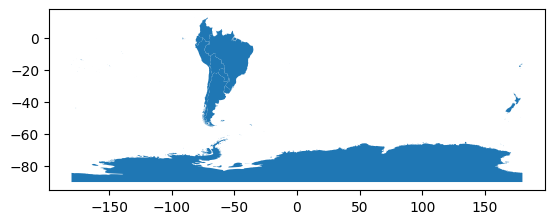

In [47]:
#then
countries.cx[:0,:0].plot()

Notice __cx__ would be cleaner if spatial element is a point.

## Clipping

Let me keep one country:

In [48]:
brazil=countries[countries.COUNTRY=='Brazil']
#see
brazil

,COUNTRY,geometry
29,Brazil,"MULTIPOLYGON (((-70.62862 -9.94849, -70.62889 ..."


Pay attention to this GDF:

In [49]:
cities

,NAME,COUNTRY,CAPITAL,geometry
0,Murmansk,Russia,N,POINT (33.08604 68.96355)
1,Arkhangelsk,Russia,N,POINT (40.64616 64.52067)
2,Saint Petersburg,Russia,N,POINT (30.45333 59.95189)
3,Magadan,Russia,N,POINT (150.78001 59.571)
4,Perm',Russia,N,POINT (56.23246 58.00024)
...,...,...,...,...
605,Singapore,Singapore,N,POINT (103.82688 1.34654)
606,Gaza,Palestine,N,POINT (34.41939 31.46288)
607,Juba,South Sudan,Y,POINT (31.76671 4.57511)
608,Dili,East Timor,Y,POINT (125.67275 -8.56601)


The GDF has a column 'COUNTRY' too.

Now, check the rivers GDF:

In [50]:
rivers

,NAME,SYSTEM,geometry
0,Aldan,Lena,"MULTILINESTRING ((124.00678 56.47258, 123.2595..."
1,Amazon,Amazon,"MULTILINESTRING ((-61.2773 -3.60706, -60.68466..."
2,Amu Darya,None,"MULTILINESTRING ((73.98818 37.49952, 73.52595 ..."
3,Amur,None,"MULTILINESTRING ((122.63956 49.9973, 120.47874..."
4,Angara,None,"MULTILINESTRING ((105.07841 51.93053, 103.9295..."
...,...,...,...
93,Yangtze,None,"MULTILINESTRING ((119.82609 32.24864, 118.9707..."
94,Yenisey,None,"MULTILINESTRING ((98.94706 52.57675, 98.12095 ..."
95,Yukon,None,"MULTILINESTRING ((-130.89319 59.2448, -131.065..."
96,Zambezi,None,"MULTILINESTRING ((35.52866 -17.66773, 36.28055..."


As you see, this GDF has no Country. But since it has geometry, you can keep the rivers, or their sections, that serve a country:

In [175]:
riversBrazil_clipped = gpd.clip(gdf=rivers,
                               mask=brazil)

Then, you can plot the clipped version:

<Axes: >

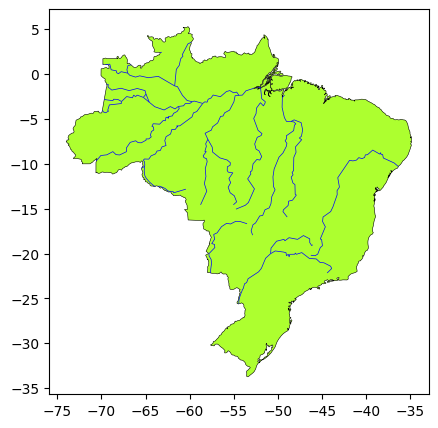

In [52]:
base = brazil.plot(facecolor="greenyellow", edgecolor='black', linewidth=0.4,figsize=(5,5))
riversBrazil_clipped.plot(edgecolor='blue', linewidth=0.5,
                    ax=base)

The geometry types are not modified:

In [53]:
set(brazil.geom_type), set(riversBrazil_clipped.geom_type)

({'MultiPolygon'}, {'LineString', 'MultiLineString'})

[TOC](#0)

_____________


<a class="anchor" id="3"></a>

# Combining GeoDF rows

Let me bring the projected data from Brazil.

In [54]:
LinkBrazil="https://github.com/CienciaDeDatosEspacial/dataSets/raw/refs/heads/main/BRAZIL/brazil_5880.gpkg"
## we have
gpd.list_layers(LinkBrazil)

,name,geometry_type
0,country,MultiPolygon
1,cities,Point
2,airports,Point
3,states,MultiPolygon
4,municipalities,MultiPolygon


Let me open municipalities:

<Axes: >

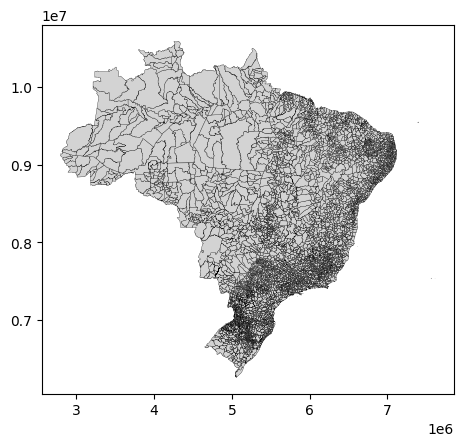

In [55]:
brazil_municipalities=gpd.read_file(LinkBrazil,layer='municipalities')
brazil_municipalities.plot(facecolor='lightgrey', edgecolor='black',linewidth=0.2)

In [56]:
#see
brazil_municipalities.head()

,ADM0_EN,ADM0_PT,ADM0_PCODE,ADM1_PT,ADM1_PCODE,ADM2_PT,ADM2_PCODE,ET_ID,geometry
0,Brazil,Brasil,BR,Rondônia,BR11,Alta Floresta D'Oeste,BR1100015,0,"MULTIPOLYGON (((4123083.754 8674925.499, 41235..."
1,Brazil,Brasil,BR,Rondônia,BR11,Ariquemes,BR1100023,1,"MULTIPOLYGON (((4076081.319 8904169.38, 407563..."
2,Brazil,Brasil,BR,Rondônia,BR11,Cabixi,BR1100031,2,"MULTIPOLYGON (((4309820.991 8508152.337, 43098..."
3,Brazil,Brasil,BR,Rondônia,BR11,Cacoal,BR1100049,3,"MULTIPOLYGON (((4234969.465 8775486.145, 42351..."
4,Brazil,Brasil,BR,Rondônia,BR11,Cerejeiras,BR1100056,4,"MULTIPOLYGON (((4218593.898 8541471.292, 42189..."


In [57]:
## we have
len(brazil_municipalities.ADM2_PT)

5572

In [58]:
# higher level count
len(set(brazil_municipalities.ADM1_PT))

27

Then, this is Minas Gerais:

<Axes: >

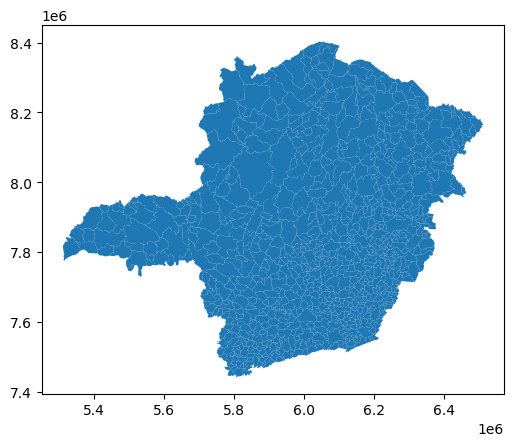

In [59]:
brazil_municipalities[brazil_municipalities.ADM1_PT=='Minas Gerais'].plot()

Let's see the options to combine:

## Unary UNION

We can combine all these polygons into one:

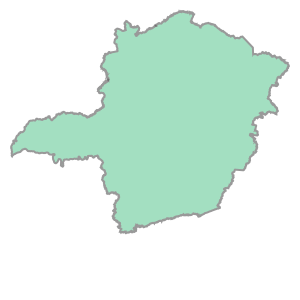

In [60]:
brazil_municipalities[brazil_municipalities.ADM1_PT=='Minas Gerais'].union_all()

Let's save that result:

In [61]:
MinasGerais_union=brazil_municipalities[brazil_municipalities.ADM1_PT=='Minas Gerais'].union_all()

In [62]:
# what do we have?
type(MinasGerais_union)

shapely.geometry.multipolygon.MultiPolygon

You can turn that shapely object into a GeoDF like this:

In [63]:
gpd.GeoDataFrame(index=[0],data={'ADM':'Minas Gerais'},
                 crs=brazil_municipalities.crs,
                 geometry=[MinasGerais_union])

,ADM,geometry
0,Minas Gerais,"MULTIPOLYGON (((5785356.379 7461893.959, 57847..."


<a class="anchor" id="21"></a>

## Dissolve

### a. Dissolve as Union
Using  **dissolve** is an alternative to _UNION_:

<Axes: >

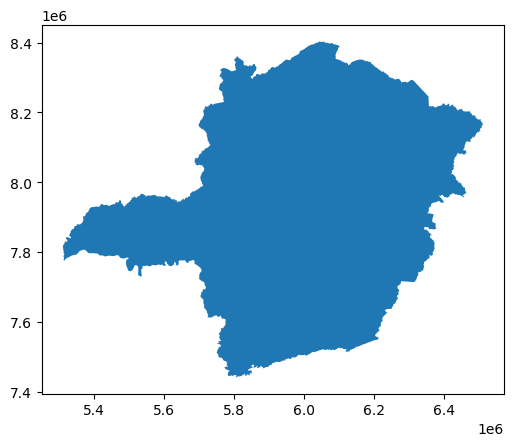

In [64]:
brazil_municipalities[brazil_municipalities.ADM1_PT=='Minas Gerais'].dissolve().plot()

Let me save the result, and see the type :

In [65]:
MinasGerais_dissolve=brazil_municipalities[brazil_municipalities.ADM1_PT=='Minas Gerais'].dissolve()

# we got?
type(MinasGerais_dissolve)

geopandas.geodataframe.GeoDataFrame

You got a GEOdf this time:

In [66]:
## see
MinasGerais_dissolve

,geometry,ADM0_EN,ADM0_PT,ADM0_PCODE,ADM1_PT,ADM1_PCODE,ADM2_PT,ADM2_PCODE,ET_ID
0,"MULTIPOLYGON (((5785356.379 7461893.959, 57847...",Brazil,Brasil,BR,Minas Gerais,BR31,Abadia dos Dourados,BR3100104,2244


In [67]:
# keeping what is relevant
MinasGerais_dissolve.drop(columns=['ADM2_PT','ADM2_PCODE','ET_ID'],inplace=True)

# then
MinasGerais_dissolve

,geometry,ADM0_EN,ADM0_PT,ADM0_PCODE,ADM1_PT,ADM1_PCODE
0,"MULTIPOLYGON (((5785356.379 7461893.959, 57847...",Brazil,Brasil,BR,Minas Gerais,BR31


### b. Dissolve for groups

Using _dissolve()_ with no arguments returns the union of the polygons, BUT also you get a GEOdf.
However, if you have a column that represents a grouping (as we do), you can dissolve by that column:

<Axes: >

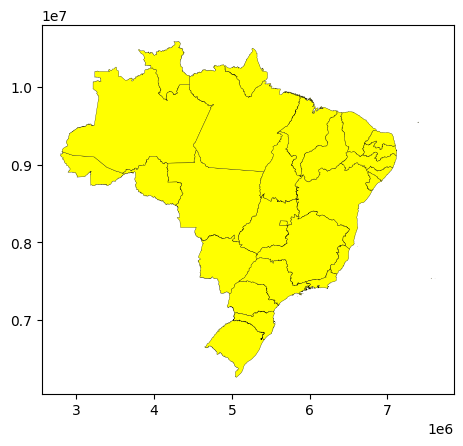

In [68]:
# dissolving
brazil_municipalities.dissolve(by='ADM1_PT').plot(facecolor='yellow', edgecolor='black',linewidth=0.2)

Again, let me save this result:

In [69]:
Brazil_adm1_diss=brazil_municipalities.dissolve(by='ADM1_PT')

We know we have a GeoDF; let's see contents:

In [70]:
Brazil_adm1_diss

,geometry,ADM0_EN,ADM0_PT,ADM0_PCODE,ADM1_PCODE,ADM2_PT,ADM2_PCODE,ET_ID
ADM1_PT,,,,,,,,
Acre,"MULTIPOLYGON (((3314561.941 8748537.521, 33145...",Brazil,Brasil,BR,BR12,Acrelândia,BR1200013,52
Alagoas,"POLYGON ((6867433.311 8839059.282, 6867224.999...",Brazil,Brasil,BR,BR27,Água Branca,BR2700102,1650
Amapá,"MULTIPOLYGON (((5243842.447 9871959.688, 52428...",Brazil,Brasil,BR,BR16,Serra do Navio,BR1600055,295
Amazonas,"MULTIPOLYGON (((3230169.545 9098328.273, 32298...",Brazil,Brasil,BR,BR13,Alvarães,BR1300029,74
Bahia,"MULTIPOLYGON (((6222869.527 8316183.361, 62224...",Brazil,Brasil,BR,BR29,Abaíra,BR2900108,1827
Ceará,"MULTIPOLYGON (((6466354.835 9252442.207, 64662...",Brazil,Brasil,BR,BR23,Abaiara,BR2300101,891
Distrito Federal,"POLYGON ((5709200.339 8232316.484, 5709090.755...",Brazil,Brasil,BR,BR53,Brasília,BR5300108,5571
Espírito Santo,"MULTIPOLYGON (((6355317.846 7598958.099, 63551...",Brazil,Brasil,BR,BR32,Afonso Cláudio,BR3200102,3097
Goiás,"MULTIPOLYGON (((5301987.78 7862263.679, 530184...",Brazil,Brasil,BR,BR52,Abadia de Goiás,BR5200050,5325


Again, we can drop columns that do not bring important information:

In [71]:
Brazil_adm1_diss.drop(columns=['ADM2_PT','ADM2_PCODE','ET_ID'],inplace=True)
Brazil_adm1_diss.reset_index(inplace=True)
Brazil_adm1_diss.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 27 entries, 0 to 26
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   ADM1_PT     27 non-null     object  
 1   geometry    27 non-null     geometry
 2   ADM0_EN     27 non-null     object  
 3   ADM0_PT     27 non-null     object  
 4   ADM0_PCODE  27 non-null     object  
 5   ADM1_PCODE  27 non-null     object  
dtypes: geometry(1), object(5)
memory usage: 1.4+ KB


### c. Dissolve and aggregate

In pandas, you can aggregate data using some statistics. Let me open the map with indicators we created in a previous session:

In [72]:
linkInd="https://github.com/CienciaDeDatosEspacial/dataSets/raw/refs/heads/main/WORLD/worldindicators.json"
indicators=gpd.read_file(linkInd)
indicators.head()

,Country,iso2,iso3,region,fragility,co2,sq_km,num_airports,population,mobiles,geometry
0,ANTIGUA AND BARBUDA,AG,ATG,CENTRAL AMERICA AND THE CARIBBEAN,54.4,729000,443,4,102634,184000,"MULTIPOLYGON (((-61.73889 17.54055, -61.75195 ..."
1,AFGHANISTAN,AF,AFG,SOUTH ASIA,105.0,7893000,652230,68,40121552,23000000,"MULTIPOLYGON (((61.27656 35.60725, 61.29638 35..."
2,ALGERIA,DZ,DZA,AFRICA,75.4,151633000,2381740,95,47022473,51500000,"MULTIPOLYGON (((-5.15213 30.18047, -5.13917 30..."
3,AZERBAIJAN,AZ,AZE,MIDDLE EAST,73.2,35389000,86600,32,10650239,11000000,"MULTIPOLYGON (((46.54037 38.87559, 46.49554 38..."
4,ALBANIA,AL,ALB,EUROPE,58.9,3794000,28748,3,3107100,2610000,"MULTIPOLYGON (((20.79192 40.43154, 20.78722 40..."


You can compute the mean of the countries by region, using a DF approach like this:

In [73]:
indicators.groupby('region').agg({'fragility':'mean'})

,fragility
region,
AFRICA,85.664706
AUSTRALIA AND OCEANIA,60.471429
CENTRAL AMERICA AND THE CARIBBEAN,62.993750
CENTRAL ASIA,72.883333
EAST AND SOUTHEAST ASIA,64.120000
EUROPE,40.418919
MIDDLE EAST,71.756250
NORTH AMERICA,42.566667
SOUTH AMERICA,63.816667



The RESULT is just data, you see no spatial information. It got lost.

The appropriate operation to conserve spatial information is **Dissolve**:

In [78]:
indicatorsByRegion=indicators.dissolve(
     by="region",
     aggfunc={
         "fragility": ["mean"]},as_index=False, grid_size=0.1
 )

## see the spatial info
indicatorsByRegion

,region,geometry,"(fragility, mean)"
0,AFRICA,"MULTIPOLYGON (((-2.92813 5.10022, -2.93222 5.1...",85.664706
1,AUSTRALIA AND OCEANIA,"MULTIPOLYGON (((-176.51779 -43.90778, -176.532...",60.471429
2,CENTRAL AMERICA AND THE CARIBBEAN,"MULTIPOLYGON (((-81.71556 7.44681, -81.71362 7...",62.993750
3,CENTRAL ASIA,"MULTIPOLYGON (((50.03472 45.04833, 50.0425 45....",72.883333
4,EAST AND SOUTHEAST ASIA,"MULTIPOLYGON (((105.26361 -6.54472, 105.26138 ...",64.120000
5,EUROPE,"MULTIPOLYGON (((-18.13223 27.77264, -18.1132 2...",40.418919
6,MIDDLE EAST,"MULTIPOLYGON (((42.76819 14.06653, 42.7868 14....",71.756250
7,NORTH AMERICA,"MULTIPOLYGON (((-155.211 20.00166, -155.18335 ...",42.566667
8,SOUTH AMERICA,"MULTIPOLYGON (((-74.93431 -51.85501, -74.93251...",63.816667
9,SOUTH ASIA,"MULTIPOLYGON (((73.10193 -0.58431, 73.09915 -0...",83.975000


Without renaming, you can request a choropleth:

In [146]:
# !pip install mapclassify

<Axes: >

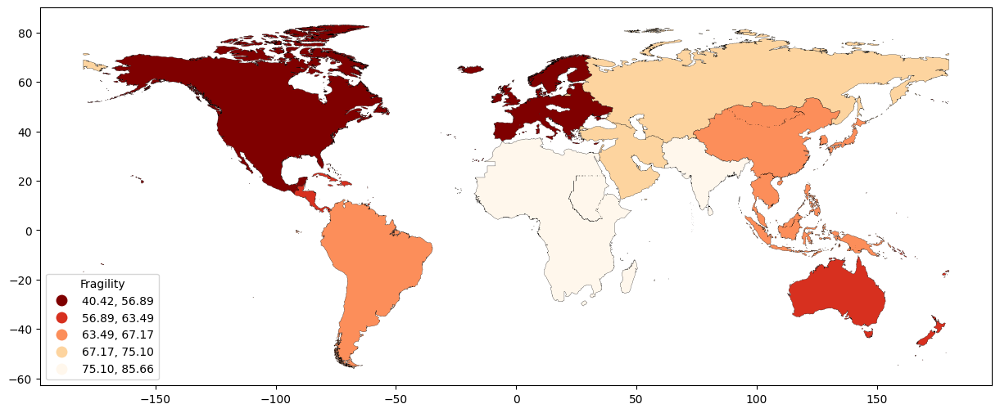

In [80]:
indicatorsByRegion.plot(column =('fragility', 'mean'),scheme='quantiles', cmap='OrRd_r',
                        legend=True,
                        legend_kwds={"title": "Fragility",'loc': 'lower left'},
                        edgecolor='black',linewidth=0.2,
                        figsize=(15, 10))

[TOC](#0)
_____________


<a class="anchor" id="4"></a>

# The convex hull

Some time you may have the need to create a polygon that serves as an envelope to a set of points.

For this example, let me compute the centroid coordinates:

In [82]:
brazil_5880=gpd.read_file(LinkBrazil,layer='country')
brazil_5880.centroid

,0
0,POINT (5085264.134 8827720.201)


In [83]:
# then
brazil_5880.centroid.x.values[0],brazil_5880.centroid.y.values[0]

(np.float64(5085264.134223759), np.float64(8827720.20102598))

Let me open the airports:

In [85]:
airports_5880=gpd.read_file(LinkBrazil,layer='airports')
airports_5880.head()

,name,kind,latitude_deg,longitude_deg,elevation_ft,region_name,municipality,geometry
0,Guarulhos - Governador André Franco Montoro In...,large_airport,-23.431944,-46.467778,2461.0,São Paulo,São Paulo,POINT (5769392.959 7387510.487)
1,Rio Galeão – Tom Jobim International Airport,large_airport,-22.809999,-43.250557,28.0,Rio de Janeiro,Rio De Janeiro,POINT (6102623.812 7436387.271)
2,Congonhas Airport,medium_airport,-23.627657,-46.654601,2631.0,São Paulo,São Paulo,POINT (5749212.286 7366698.145)
3,Santos Dumont Airport,medium_airport,-22.910500,-43.163101,11.0,Rio de Janeiro,Rio de Janeiro,POINT (6110753.219 7424462.721)
4,Presidente Juscelino Kubitschek International ...,large_airport,-15.869167,-47.920834,3497.0,Distrito Federal,Brasília,POINT (5651010.181 8235390.09)


Now, let me plot some airports, using the centroid:

In [86]:
# coordinates
centroidX,centroidY=brazil_5880.centroid.x.values[0],brazil_5880.centroid.y.values[0]

# subsets of medium airports
Brazil_AirTopLeft=airports_5880[airports_5880.kind=='medium_airport'].cx[:centroidX,centroidY:]
Brazil_AirTopRight=airports_5880[airports_5880.kind=='medium_airport'].cx[centroidX:,centroidY:]
Brazil_AirBottomLeft=airports_5880[airports_5880.kind=='medium_airport'].cx[:centroidX,:centroidY]
Brazil_AirBottomRight=airports_5880[airports_5880.kind=='medium_airport'].cx[centroidX:,:centroidY]

Let me plot the subsets:

<Axes: >

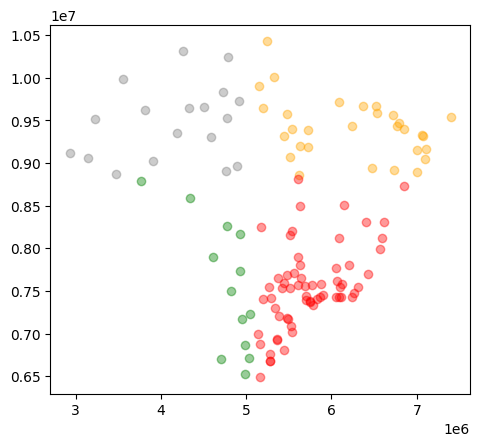

In [87]:
base=Brazil_AirTopLeft.plot(facecolor='grey', alpha=0.4)
Brazil_AirTopRight.plot(ax=base,facecolor='orange', alpha=0.4)
Brazil_AirBottomLeft.plot(ax=base,facecolor='green', alpha=0.4)
Brazil_AirBottomRight.plot(ax=base,facecolor='red', alpha=0.4)

Notice we have simple points in each subset:

In [88]:
Brazil_AirBottomLeft

,name,kind,latitude_deg,longitude_deg,elevation_ft,region_name,municipality,geometry
8,Cataratas International Airport,medium_airport,-25.594167,-54.489444,786.0,Paraná,Foz do Iguaçu,POINT (4950830.956 7168034.87)
15,Campo Grande Airport,medium_airport,-20.469998,-54.673988,1833.0,Mato Grosso do Sul,Campo Grande,POINT (4929681.015 7735456.924)
20,Marechal Rondon Airport,medium_airport,-15.652900,-56.116699,617.0,Mato Grosso,Cuiabá,POINT (4773057.197 8267634.729)
50,Coronel Adalberto Mendes da Silva Airport,medium_airport,-25.000323,-53.501208,2481.0,Paraná,Cascavel,POINT (5050352.852 7233817.423)
75,Ponta Porã Airport,medium_airport,-22.549601,-55.702599,2156.0,Mato Grosso do Sul,Ponta Porã,POINT (4824875.266 7504342.168)
77,Santo Ângelo Airport,medium_airport,-28.282503,-54.169623,1056.0,Rio Grande do Sul,Santo Ângelo,POINT (4983359.285 6870239.109)
85,Maestro Marinho Franco Airport,medium_airport,-16.584292,-54.724803,1467.0,Mato Grosso,Rondonópolis,POINT (4922650.786 8165558.364)
86,Brigadeiro Camarão Airport,medium_airport,-12.694400,-60.098301,2018.0,Rondônia,Vilhena,POINT (4337687.586 8588351.619)
105,Santa Maria Airport,medium_airport,-29.711399,-53.688202,287.0,Rio Grande do Sul,Santa Maria,POINT (5030170.86 6711837.339)
141,Corumbá International Airport,medium_airport,-19.011930,-57.672772,463.0,Mato Grosso do Sul,Corumbá,POINT (4613342.128 7892974.048)


In this situation, you can NOT make a _convex hull_:

<Axes: >

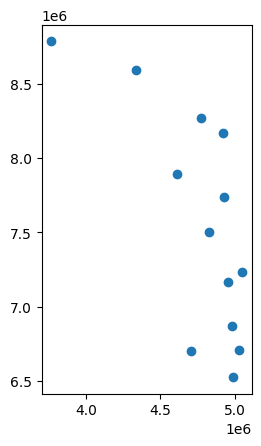

In [89]:
Brazil_AirBottomLeft.convex_hull.plot()

You first need to **dissolve**, and then you create a hull, an envelope of  convex angles:

<Axes: >

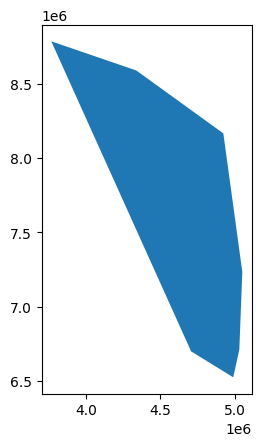

In [90]:
Brazil_AirBottomLeft.dissolve().convex_hull.plot()

As we saw, the convex hull is a polygon:

In [91]:
Brazil_AirBottomLeft.dissolve().convex_hull

,0
0,"POLYGON ((4989328.148 6525724.505, 4706251.341..."


What if we have the polygons that had not been previously combined?

<Axes: >

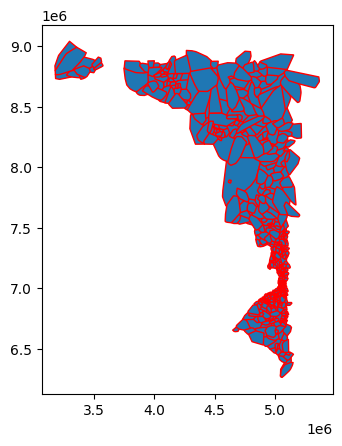

In [97]:
brazil_municipalities.cx[:centroidX,:centroidY].convex_hull.plot(edgecolor='red')

In [ ]:
# notice
brazil_municipalities.cx[:centroidX,:centroidY].dissolve().convex_hull.plot(edgecolor='red')

That is, you get a convex hull for each geometry.

We can also use _union_ before creating a convex hull:

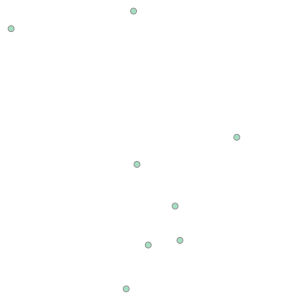

In [98]:
# just the union
large_airport=airports_5880[airports_5880.kind=='large_airport']
large_airport.union_all()

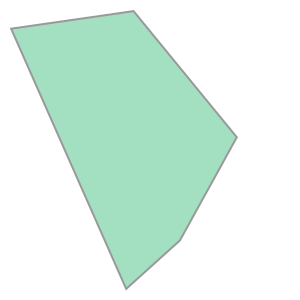

In [94]:
# hull of the union
large_airport.union_all().convex_hull

Let's turn the GS into a GDF:

In [99]:
LargeAirport_hull= gpd.GeoDataFrame(index=[0],
                                    crs=large_airport.crs,
                                    geometry=[large_airport.union_all().convex_hull])
LargeAirport_hull['name']='large airports hull' # optional

# then

LargeAirport_hull

,geometry,name
0,"POLYGON ((5537273.577 6926234.097, 4327494.283...",large airports hull


Let's use the GDF in plotting:

<Axes: >

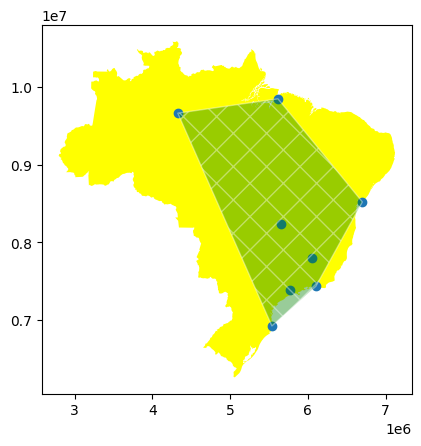

In [100]:
base=brazil_5880.plot(facecolor='yellow')
large_airport.plot(ax=base)
LargeAirport_hull.plot(ax=base,facecolor='green',
                       edgecolor='white',alpha=0.4,
                       hatch='X')

[TOC](#0)
_____________

<a class="anchor" id="5"></a>
# Spatial Overlay

We might need to create or find some geometries from the geometries we already have. Using a set theory approach, we will se the use of _intersection_, _union_, _difference_, and _symmetric difference_.

Let me create this GeoDFs:

In [101]:
# the north
MunisN_brazil=brazil_municipalities.cx[:,centroidY:]
# the south
MunisS_brazil=brazil_municipalities.cx[:,:centroidY]
# the west
MunisW_brazil=brazil_municipalities.cx[:centroidX,:]
# the east
MunisE_brazil=brazil_municipalities.cx[centroidX:,:]

Let me plot:

<Axes: >

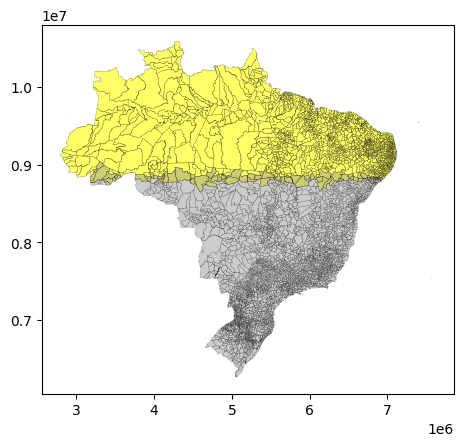

In [102]:
base=MunisN_brazil.plot(facecolor='yellow', edgecolor='black',linewidth=0.2, alpha=0.6)
MunisS_brazil.plot(facecolor='grey', edgecolor='black',linewidth=0.2,ax=base, alpha=0.4)

<Axes: >

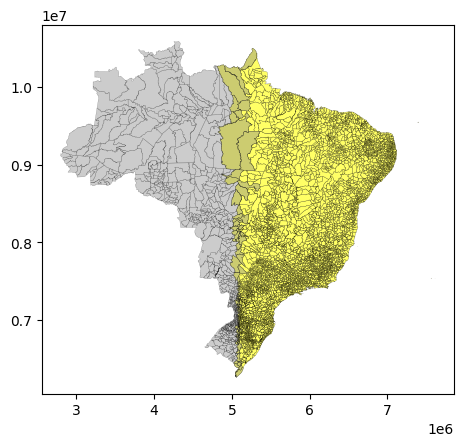

In [103]:
base=MunisE_brazil.plot(facecolor='yellow', edgecolor='black',linewidth=0.2, alpha=0.6)
MunisW_brazil.plot(facecolor='grey', edgecolor='black',linewidth=0.2,ax=base, alpha=0.4)

## Intersection

We keep what is common between GeoDFs:

<Axes: >

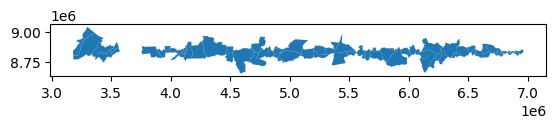

In [104]:
munisNS_brazil=MunisN_brazil.overlay(MunisS_brazil, how="intersection",keep_geom_type=True)
munisNS_brazil.plot()

<Axes: >

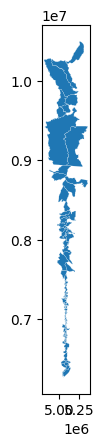

In [105]:
# keeping the overlay
munisWE_brazil=MunisW_brazil.overlay(MunisE_brazil, how="intersection",keep_geom_type=True)
munisWE_brazil.plot(edgecolor='white',linewidth=0.1)

## Union

Let me unite any polygons that touche each other. First, take a look at each one:

In [106]:
munisNS_brazil.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 76 entries, 0 to 75
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   ADM0_EN_1     76 non-null     object  
 1   ADM0_PT_1     76 non-null     object  
 2   ADM0_PCODE_1  76 non-null     object  
 3   ADM1_PT_1     76 non-null     object  
 4   ADM1_PCODE_1  76 non-null     object  
 5   ADM2_PT_1     76 non-null     object  
 6   ADM2_PCODE_1  76 non-null     object  
 7   ET_ID_1       76 non-null     int32   
 8   ADM0_EN_2     76 non-null     object  
 9   ADM0_PT_2     76 non-null     object  
 10  ADM0_PCODE_2  76 non-null     object  
 11  ADM1_PT_2     76 non-null     object  
 12  ADM1_PCODE_2  76 non-null     object  
 13  ADM2_PT_2     76 non-null     object  
 14  ADM2_PCODE_2  76 non-null     object  
 15  ET_ID_2       76 non-null     int32   
 16  geometry      76 non-null     geometry
dtypes: geometry(1), int32(2), object(14)
memory usag

In [107]:
munisWE_brazil.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 103 entries, 0 to 102
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   ADM0_EN_1     103 non-null    object  
 1   ADM0_PT_1     103 non-null    object  
 2   ADM0_PCODE_1  103 non-null    object  
 3   ADM1_PT_1     103 non-null    object  
 4   ADM1_PCODE_1  103 non-null    object  
 5   ADM2_PT_1     103 non-null    object  
 6   ADM2_PCODE_1  103 non-null    object  
 7   ET_ID_1       103 non-null    int32   
 8   ADM0_EN_2     103 non-null    object  
 9   ADM0_PT_2     103 non-null    object  
 10  ADM0_PCODE_2  103 non-null    object  
 11  ADM1_PT_2     103 non-null    object  
 12  ADM1_PCODE_2  103 non-null    object  
 13  ADM2_PT_2     103 non-null    object  
 14  ADM2_PCODE_2  103 non-null    object  
 15  ET_ID_2       103 non-null    int32   
 16  geometry      103 non-null    geometry
dtypes: geometry(1), int32(2), object(14)
memory us

Let me subset and show you:

In [108]:
keep=['ADM0_EN_1','ADM1_PT_1','ADM2_PT_1','geometry']
munisNS_brazil=munisNS_brazil.loc[:,keep]
munisWE_brazil=munisWE_brazil.loc[:,keep]

In [109]:
# now
munisNS_brazil.overlay(munisWE_brazil,how="union",keep_geom_type=True)

,ADM0_EN_1_1,ADM1_PT_1_1,ADM2_PT_1_1,ADM0_EN_1_2,ADM1_PT_1_2,ADM2_PT_1_2,geometry
0,Brazil,Mato Grosso,Marcelândia,Brazil,Mato Grosso,Marcelândia,"POLYGON ((5098644.898 8806957.586, 5098469.995..."
1,Brazil,Mato Grosso,Peixoto de Azevedo,Brazil,Mato Grosso,Peixoto de Azevedo,"POLYGON ((5151520.831 8928990.056, 5151240.383..."
2,Brazil,Rondônia,Jaru,NaN,NaN,NaN,"POLYGON ((4108723.185 8857522.955, 4108572.174..."
3,Brazil,Rondônia,Ji-Paraná,NaN,NaN,NaN,"POLYGON ((4168931.208 8915727.857, 4169154.869..."
4,Brazil,Rondônia,Ouro Preto do Oeste,NaN,NaN,NaN,"POLYGON ((4113351.443 8786099.885, 4112118.816..."
...,...,...,...,...,...,...,...
172,NaN,NaN,NaN,Brazil,Mato Grosso,São Félix do Araguaia,"POLYGON ((5195517.591 8777892.264, 5195688.888..."
173,NaN,NaN,NaN,Brazil,Mato Grosso,Tesouro,"POLYGON ((5093089.233 8259200.78, 5093553.355 ..."
174,NaN,NaN,NaN,Brazil,Mato Grosso,Torixoréu,"POLYGON ((5163229.755 8215731.456, 5162831.364..."
175,NaN,NaN,NaN,Brazil,Goiás,Mineiros,"MULTIPOLYGON (((5119016.013 7937060.91, 511846..."


As you see, geometries are fine, but not attributes. It is strictly NOT appending the GeoDFs:

In [118]:
# appending
import pandas as pd

pd.concat([munisNS_brazil,munisWE_brazil],ignore_index=True)

,ADM0_EN_1,ADM1_PT_1,ADM2_PT_1,geometry
0,Brazil,Rondônia,Jaru,"POLYGON ((4108723.185 8857522.955, 4108572.174..."
1,Brazil,Rondônia,Ji-Paraná,"POLYGON ((4168931.208 8915727.857, 4169154.869..."
2,Brazil,Rondônia,Ouro Preto do Oeste,"POLYGON ((4113351.443 8786099.885, 4112118.816..."
3,Brazil,Rondônia,Nova Mamoré,"POLYGON ((3874766.788 8876592.987, 3875117.879..."
4,Brazil,Rondônia,Cacaulândia,"POLYGON ((4047989.336 8845107.634, 4041833.31 ..."
...,...,...,...,...
174,Brazil,Mato Grosso,São Félix do Araguaia,"POLYGON ((5194449.629 8778871.31, 5195081.855 ..."
175,Brazil,Mato Grosso,Tesouro,"POLYGON ((5093089.233 8259200.78, 5093553.355 ..."
176,Brazil,Mato Grosso,Torixoréu,"POLYGON ((5163229.755 8215731.456, 5162831.364..."
177,Brazil,Goiás,Mineiros,"MULTIPOLYGON (((5119016.013 7937060.91, 511846..."


These are different operations. UNION will combine any geometries that have overlaping portions in common.

In [115]:
munisNS_brazil.overlay(munisWE_brazil, how="union",keep_geom_type=True)

,ADM0_EN_1_1,ADM1_PT_1_1,ADM2_PT_1_1,ADM0_EN_1_2,ADM1_PT_1_2,ADM2_PT_1_2,geometry
0,Brazil,Mato Grosso,Marcelândia,Brazil,Mato Grosso,Marcelândia,"POLYGON ((5098644.898 8806957.586, 5098469.995..."
1,Brazil,Mato Grosso,Peixoto de Azevedo,Brazil,Mato Grosso,Peixoto de Azevedo,"POLYGON ((5151520.831 8928990.056, 5151240.383..."
2,Brazil,Rondônia,Jaru,NaN,NaN,NaN,"POLYGON ((4108723.185 8857522.955, 4108572.174..."
3,Brazil,Rondônia,Ji-Paraná,NaN,NaN,NaN,"POLYGON ((4168931.208 8915727.857, 4169154.869..."
4,Brazil,Rondônia,Ouro Preto do Oeste,NaN,NaN,NaN,"POLYGON ((4113351.443 8786099.885, 4112118.816..."
...,...,...,...,...,...,...,...
172,NaN,NaN,NaN,Brazil,Mato Grosso,São Félix do Araguaia,"POLYGON ((5195517.591 8777892.264, 5195688.888..."
173,NaN,NaN,NaN,Brazil,Mato Grosso,Tesouro,"POLYGON ((5093089.233 8259200.78, 5093553.355 ..."
174,NaN,NaN,NaN,Brazil,Mato Grosso,Torixoréu,"POLYGON ((5163229.755 8215731.456, 5162831.364..."
175,NaN,NaN,NaN,Brazil,Goiás,Mineiros,"MULTIPOLYGON (((5119016.013 7937060.91, 511846..."


Let me create an object to save the previous result:

In [119]:
muniMidBrazil=munisNS_brazil.overlay(munisWE_brazil, how="union",keep_geom_type=True).dissolve()
muniMidBrazil

,geometry,ADM0_EN_1_1,ADM1_PT_1_1,ADM2_PT_1_1,ADM0_EN_1_2,ADM1_PT_1_2,ADM2_PT_1_2
0,"MULTIPOLYGON (((5122999.937 7726808.31, 512270...",Brazil,Mato Grosso,Marcelândia,Brazil,Mato Grosso,Marcelândia


In [120]:
# some cleaning

muniMidBrazil['zone']='middles'
muniMidBrazil=muniMidBrazil.loc[:,['ADM0_EN_1_1','zone','geometry']]
muniMidBrazil

,ADM0_EN_1_1,zone,geometry
0,Brazil,middles,"MULTIPOLYGON (((5122999.937 7726808.31, 512270..."


## Difference

Here, you keep what belongs to the GeoDF to left that is not in the GeoDF to the right:

<Axes: >

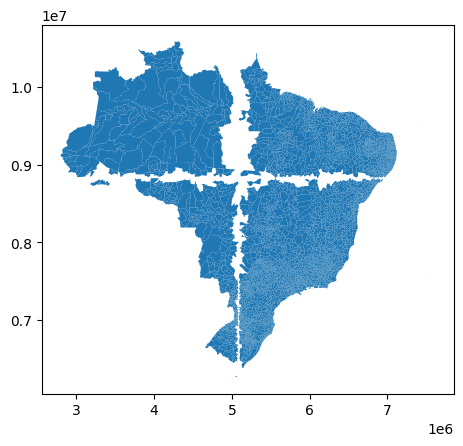

In [121]:
# with the municipalities
brazil_municipalities.overlay(muniMidBrazil, how='difference').plot()

## Symmetric Difference

This is the opposite to *intersection*, you keep what is not in the intersection:

<Axes: >

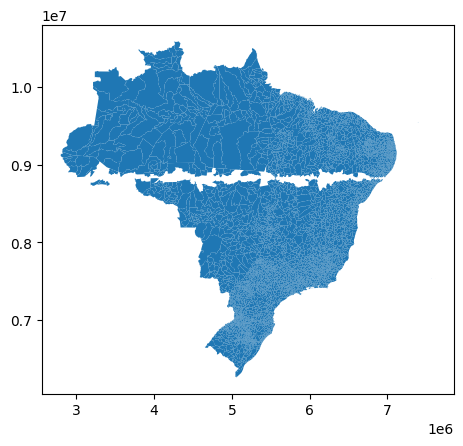

In [122]:
MunisN_brazil.overlay(MunisS_brazil, how="symmetric_difference",keep_geom_type=True).plot()

<Axes: >

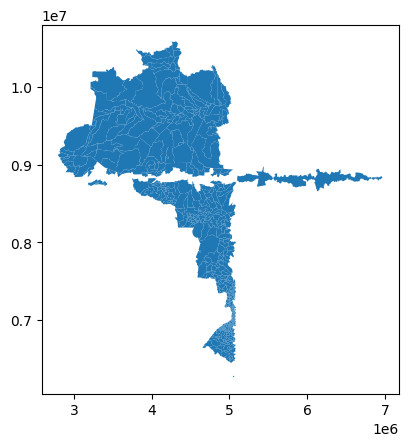

In [123]:
MunisW_brazil.overlay(muniMidBrazil, how="symmetric_difference",keep_geom_type=False).plot()

[TOC](#0)
_____________

<a class="anchor" id="6"></a>

# Validity of Geometry

Geometries are created in a way that some issues may appear, especially in (multi) polygons.
Let's check if our recent maps on states and municipalities are valid:

In [124]:
# non valid
MunisS_brazil[~MunisS_brazil.is_valid]

,ADM0_EN,ADM0_PT,ADM0_PCODE,ADM1_PT,ADM1_PCODE,ADM2_PT,ADM2_PCODE,ET_ID,geometry
5,Brazil,Brasil,BR,Rondônia,BR11,Colorado do Oeste,BR1100064,5,"MULTIPOLYGON (((4313647.61 8525120.475, 431347..."
15,Brazil,Brasil,BR,Rondônia,BR11,Pimenta Bueno,BR1100189,15,"MULTIPOLYGON (((4294830.398 8724133.878, 42945..."
22,Brazil,Brasil,BR,Rondônia,BR11,São Miguel do Guaporé,BR1100320,22,"MULTIPOLYGON (((3995610.18 8756629.778, 399594..."
70,Brazil,Brasil,BR,Acre,BR12,Sena Madureira,BR1200500,70,"MULTIPOLYGON (((3245522.781 8781320.483, 32454..."
363,Brazil,Brasil,BR,Tocantins,BR17,Formoso do Araguaia,BR1708205,363,"MULTIPOLYGON (((5482254.101 8732981.452, 54826..."
...,...,...,...,...,...,...,...,...,...
5464,Brazil,Brasil,BR,Goiás,BR52,Matrinchã,BR5212956,5464,"MULTIPOLYGON (((5352679.112 8329252.4, 5352376..."
5470,Brazil,Brasil,BR,Goiás,BR52,Monte Alegre de Goiás,BR5213509,5470,"MULTIPOLYGON (((5818737.103 8544019.649, 58188..."
5471,Brazil,Brasil,BR,Goiás,BR52,Montes Claros de Goiás,BR5213707,5471,"MULTIPOLYGON (((5279758.702 8238732.745, 52796..."
5496,Brazil,Brasil,BR,Goiás,BR52,Padre Bernardo,BR5215603,5496,"MULTIPOLYGON (((5606845.568 8322098.147, 56065..."


<Axes: >

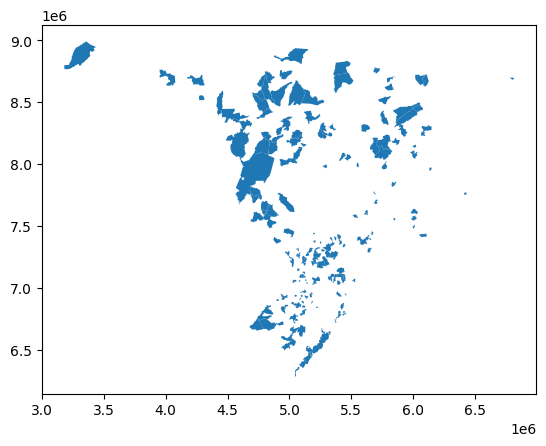

In [125]:
# see the invalid:
MunisS_brazil[~MunisS_brazil.is_valid].plot()

It is difficult to see what is wrong. Let's get some information:

In [126]:
# what is wrong?

from shapely.validation import explain_validity, make_valid

explain_validity(MunisS_brazil[~MunisS_brazil.is_valid].geometry)

,geometry
5,Ring Self-intersection[4310798.44632364 852033...
15,Ring Self-intersection[4303566.45118609 868079...
22,Ring Self-intersection[3952871.60665509 871735...
70,Ring Self-intersection[3245522.78054178 878132...
363,Ring Self-intersection[5414670.76683109 862312...
...,...
5464,Ring Self-intersection[5345209.39237221 828479...
5470,Ring Self-intersection[5781427.65454116 849211...
5471,Ring Self-intersection[5231129.55794529 823493...
5496,Ring Self-intersection[5606845.56795533 832209...


In [128]:
# varieties?
MunisS_brazil['validity']=[x.split('[')[0] for x in MunisS_brazil.geometry.apply(lambda x: explain_validity(x))]
MunisS_brazil['validity'].value_counts()

/usr/local/lib/python3.12/dist-packages/geopandas/geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,count
validity,
Valid Geometry,3700
Ring Self-intersection,201


In [129]:
# solving the issue:
MunisS_brazil.drop(columns=['validity'],inplace=True)

MunisS_brazil_valid=MunisS_brazil.copy()

MunisS_brazil_valid['geometry'] = [make_valid(row)  if not row.is_valid else row for row in MunisS_brazil_valid['geometry'] ]
#any invalid?
MunisS_brazil_valid[~MunisS_brazil_valid.is_valid]

/tmp/ipython-input-2348335625.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  MunisS_brazil.drop(columns=['validity'],inplace=True)


,ADM0_EN,ADM0_PT,ADM0_PCODE,ADM1_PT,ADM1_PCODE,ADM2_PT,ADM2_PCODE,ET_ID,geometry


The _solution_ we got may help for some advanced techniques, but may also give us some extra trouble. Notice that once geopandas solved the problem, you  have created **collections**:

In [130]:
pd.Series([type(x) for x in MunisS_brazil_valid.geometry]).value_counts()

,count
<class 'shapely.geometry.multipolygon.MultiPolygon'>,3768
<class 'shapely.geometry.polygon.Polygon'>,124
<class 'shapely.geometry.collection.GeometryCollection'>,9


## The Buffer

The buffer will create polygon that follows the same shape of the original vector (line, polygon, point).


<Axes: >

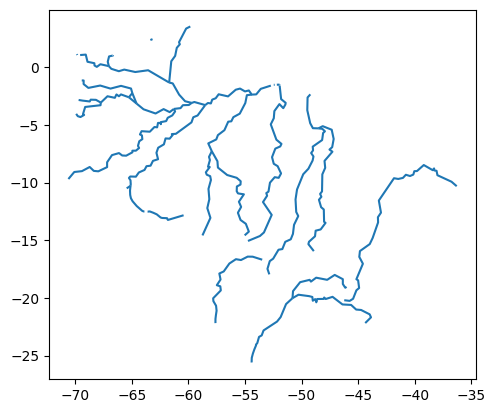

In [176]:
# this is the original
riversBrazil_clipped.plot()

But, verify crs as we are going to use distances:

In [177]:
riversBrazil_clipped.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Let's reproject:

In [178]:
riversBrazil_5880=riversBrazil_clipped.copy()
riversBrazil_5880 = riversBrazil_5880.to_crs('EPSG:5880')

Now I can use the rivers to create a buffer of 50000 meters:

<Axes: >

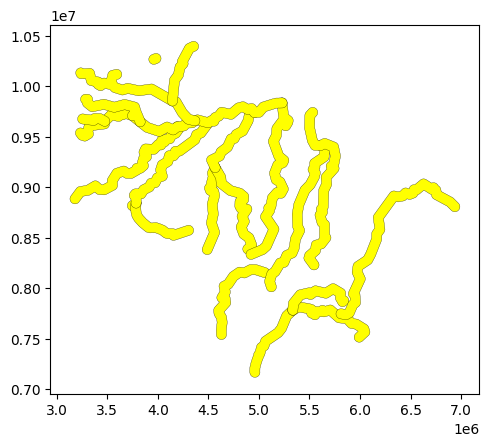

In [180]:
# 50000 at each side (radius)
riversBrazil_5880.buffer(50000).plot(facecolor='yellow', edgecolor='black',linewidth=0.2)

Then

<Axes: >

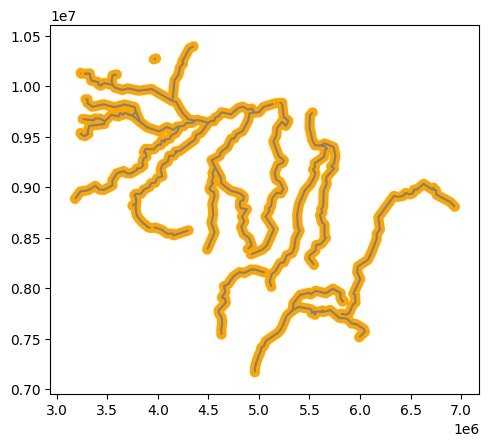

In [182]:
base=riversBrazil_5880.buffer(50000).plot(facecolor='orange', linewidth=0.2)
riversBrazil_5880.plot( edgecolor='grey',ax=base)

The buffering process helps cleaning simple invalidities:

In [183]:
MunisS_brazil_valid=MunisS_brazil.copy()

MunisS_brazil_valid['geometry'] = MunisS_brazil_valid['geometry'].buffer(0)

#any invalid?
MunisS_brazil_valid[~MunisS_brazil_valid.is_valid]

,ADM0_EN,ADM0_PT,ADM0_PCODE,ADM1_PT,ADM1_PCODE,ADM2_PT,ADM2_PCODE,ET_ID,geometry


Comparing with the previous result, this time you got no collections:

In [184]:
# then:
pd.Series([type(x) for x in MunisS_brazil_valid.geometry]).value_counts()

,count
<class 'shapely.geometry.polygon.Polygon'>,3557
<class 'shapely.geometry.multipolygon.MultiPolygon'>,344


This 'buffer trick' may not always work:

<Axes: >

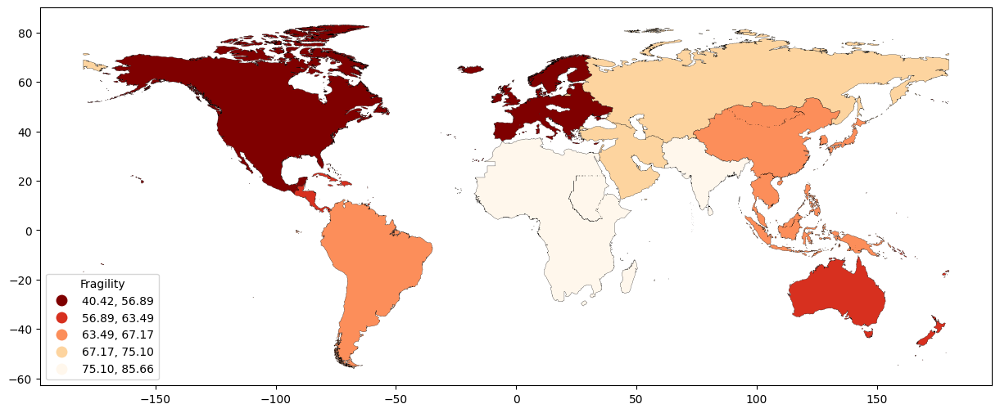

In [185]:
# previously
indicators.dissolve(
     by="region",
     aggfunc={
         "fragility": ["mean"]},as_index=False
 ).plot(column =('fragility', 'mean'),scheme='quantiles', cmap='OrRd_r',
                        legend=True,
                        legend_kwds={"title": "Fragility",'loc': 'lower left'},
                        edgecolor='black',linewidth=0.2,
                        figsize=(15, 10))

Notice that AFRICA has some lines that should have dissappeared after dissolving, but you can still see some lines.

We could try the buffer trick:

<Axes: >

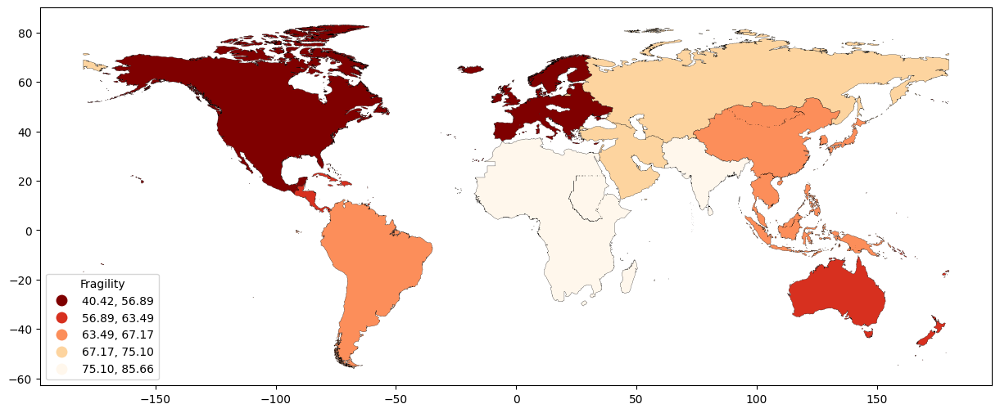

In [144]:
indicators_valid=indicators.copy()
indicators_valid['geometry'] = indicators_valid['geometry'].buffer(0)
dissolved_gdf=indicators_valid.dissolve(
     by="region",
     aggfunc={
         "fragility": ["mean"]},as_index=False, grid_size=0.1
 )




dissolved_gdf.plot(column =('fragility', 'mean'),scheme='quantiles', cmap='OrRd_r',
                        legend=True,
                        legend_kwds={"title": "Fragility",'loc': 'lower left'},
                        edgecolor='black',linewidth=0.2,
                        figsize=(15, 10))

It did not work either. We may use a new functionality in GeoPandas's dissolve:

<Axes: >

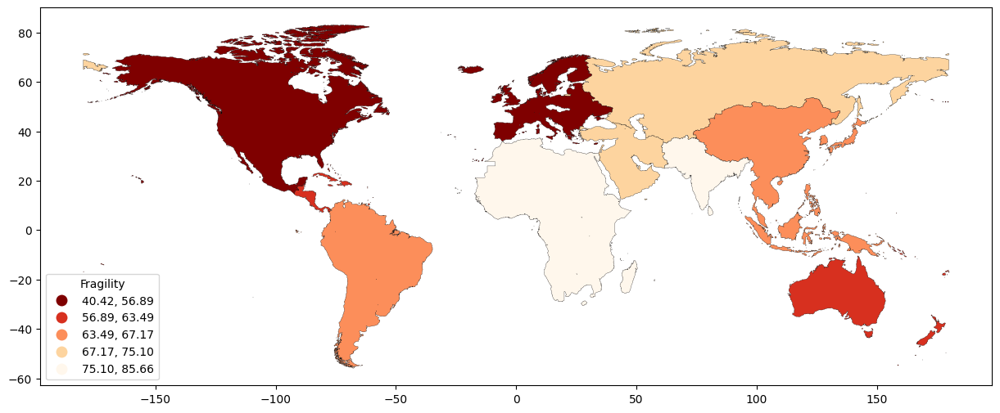

In [186]:
dissolved_gdf=indicators.dissolve(
     by="region",
     aggfunc={
         "fragility": ["mean"]},as_index=False, grid_size=0.1
 )




dissolved_gdf.plot(column =('fragility', 'mean'),scheme='quantiles', cmap='OrRd_r',
                        legend=True,
                        legend_kwds={"title": "Fragility",'loc': 'lower left'},
                        edgecolor='black',linewidth=0.2,
                        figsize=(15, 10))

Now, you do see a clean map.